In [1]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
from collections import defaultdict

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import random

In [2]:
lemmatizer = WordNetLemmatizer()

def lemma(word):
    word = word.strip()

    noun = lemmatizer.lemmatize(word)
    if noun != word:
        return noun

    adjective = lemmatizer.lemmatize(word, pos="a")
    if adjective != word:
        return adjective

    verb = lemmatizer.lemmatize(word, pos="v")
    if verb != word:
        return verb

    return word

stopwordDict = defaultdict(int)
for sw in stopwords.words("english"):
    stopwordDict[sw] += 1

In [3]:
import pymongo
# client = pymongo.MongoClient(host="128.195.180.83",
#                              port=27939,
#                              username="db_writer",
#                              password="ucidsplab_dbwriter"
#                              )

# db = client.cloudflare_crawled_data

client = pymongo.MongoClient(host="128.195.180.83",
                             port=27939,
                             username="db_viewer",
                             password="ucidsplab_dbviewer"
                             )
db = client.cloudflare_crawled_data

corpus, corpus_index, url_list = [], [], []
startPage, endPage = 100, 1354

for i in range(startPage, endPage + 1):
    col_name = "purepage" + str(i)
    collection = db[col_name]
    
    for page in collection.find():
        if not page["DNS_Related"]:
            continue
        
        if "Other Languages" in page["labels"]:
            continue
            
#         date = page["created_date"].split(",")
#         year = date[1][1:5]
#         if year != "2021" and year != "2020":
#             continue
    
        unclassified = True
        if unclassified:
            
            unprocessed, processed = page["original_post"], []
            for word in unprocessed.split(" "):
                lem = lemma(word.strip().lower())
            
                try:
                    _ = int(lem)
                    continue
                except:
                    pass
                
                if lem not in stopwordDict:
                    flag = False
                    for char in lem:
                        if char < "a" or char > "z":
                            flag = True
                    if not flag:
                        processed.append(lem)
                    
            corpus.append(" ".join(processed))
            corpus_index.append(page["title"])
            url_list.append(page["url"])
             
    
print(corpus)
print(len(corpus))

['hello currently experience issue resolve domain confluence cornell edu result dig cornell edu global option cmd get answer query status servfail id flag qr rd ra query answer authority additional opt pseudosection edns version flag udp opt opt question section confluence cornell edu query time msec server thu dec est msg size rcvd cornell edu global option cmd get answer query status servfail id flag qr rd ra query answer authority additional opt pseudosection edns version flag udp opt opt question section confluence cornell edu query time msec server thu dec est msg size rcvd use google dns cornell edu global option cmd get answer query status noerror id flag qr rd ra query answer authority additional opt pseudosection edns version flag udp question section confluence cornell edu answer section confluence cornell edu cname contegix com contegix com query time msec server thu dec est msg size rcvd interest part note cname response dig cname get correct cornell edu cname global option

In [4]:
#vectorizer = TfidfVectorizer(min_df = 5, max_features = 8000, stop_words = "english")
vectorizer = TfidfVectorizer(min_df = 3,
                             max_features = 10000)


# vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)
dimensions = vectorizer.get_feature_names()
dimensions

['aa',
 'aaa',
 'aaaa',
 'ab',
 'abandon',
 'abby',
 'abc',
 'abcd',
 'ability',
 'able',
 'abort',
 'absence',
 'absent',
 'absolute',
 'absolutely',
 'abuse',
 'ac',
 'academy',
 'acc',
 'accelerate',
 'accept',
 'acceptable',
 'acces',
 'access',
 'accessible',
 'accident',
 'accidentally',
 'accompany',
 'accomplish',
 'accord',
 'accordingly',
 'account',
 'acct',
 'accurate',
 'accurately',
 'ace',
 'acessar',
 'achieve',
 'ack',
 'acknowledge',
 'acl',
 'acm',
 'acme',
 'acquire',
 'across',
 'act',
 'action',
 'activate',
 'activation',
 'active',
 'actived',
 'actively',
 'activity',
 'actor',
 'actual',
 'actually',
 'actualmente',
 'ad',
 'adam',
 'adapt',
 'adapter',
 'add',
 'addeventlistener',
 'addition',
 'additional',
 'additionally',
 'addon',
 'addr',
 'address',
 'adguard',
 'adhere',
 'adi',
 'adjust',
 'adjustment',
 'admin',
 'administration',
 'administrator',
 'admins',
 'admit',
 'adopt',
 'adres',
 'adress',
 'adresse',
 'adresses',
 'adsense',
 'adsl',
 'adu

In [5]:
num_posts, dimensions=X.shape
num_posts, dimensions

(12145, 5243)

In [6]:
df = pd.DataFrame(X.T.todense(), index=vectorizer.get_feature_names(), columns=corpus_index)
df

,dns-failing-to-resolve_332169,how-to-registrar-on-whois-nameserver-for-my-domain-registered-with-cloudflare_332130,enter-your-question-herei-removed-my-domain-within-cf-but-my-hosting-provider-still-uses-cf-name-servers-what-to-do_332139,my-website-is-not-loading_331419,official-page_332106,cant-transfer-domain_332083,srv-and-txt-records-not-working-as-expected-due-to-preceding-underscore-requirement-in-service-name_332069,the-mx-record-mail-domin-name-not-working_331990,domain-transfer-fee-not-as-advertised_331991,connecting-cloudflare-to-a-godaddy-domain-that-is-managed-by-wordpress_331523,...,over-200ms-rtt-to-cloudflare-ips-from-some-australian-carriers-telstra-and-optus_135218,workers-sites-and-static-content-is-not-defined_135511,creating-a-dns-record-with-api-in-php_134888,1-1-1-1-doh-not-working-on-brave_134897,no-incoming-e-mail_135611,how-to-recover-dns-records_135712,subdomain-dns-not-resolved_135661,unable-to-resolve-www-coinbase-com-with-1-1-1-1_133671,google-maps-api-key-restriction-does-not-work_135585,1016-error-too_135595
aa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
aaa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.060835,0.0,0.0
aaaa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
ab,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
abandon,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zone,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.080554,0.047071,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
zoneid,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.266633,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
zoom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0
zu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [9]:
X
tfidf_array = np.asarray(X.todense())

In [11]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
distance_array = pairwise_distances(tfidf_array, metric='cosine')

In [12]:
distance_array

array([[0.        , 0.98109402, 0.97335623, ..., 0.895449  , 0.95989403,
        1.        ],
       [0.98109402, 0.        , 0.95267866, ..., 0.83424691, 0.92480941,
        0.99177067],
       [0.97335623, 0.95267866, 0.        , ..., 0.93006665, 0.90638336,
        1.        ],
       ...,
       [0.895449  , 0.83424691, 0.93006665, ..., 0.        , 0.97711623,
        1.        ],
       [0.95989403, 0.92480941, 0.90638336, ..., 0.97711623, 0.        ,
        1.        ],
       [1.        , 0.99177067, 1.        , ..., 1.        , 1.        ,
        0.        ]])

In [13]:
import numpy as np

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

clustering = DBSCAN(eps=0.6, min_samples=2).fit(distance_array)

In [14]:
core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_] = True
labels = clustering.labels_
labels

array([-1, -1, -1, ..., -1, -1, -1], dtype=int64)

In [16]:
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print(n_clusters_)
print(n_noise_)

93
11945


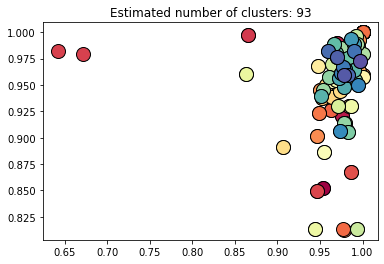

In [17]:
import matplotlib.pyplot as plt
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        continue
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = distance_array[class_member_mask & core_samples_mask]
    plt.plot(
        xy[:,0],
        xy[:,1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
    )

    xy = distance_array[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy[:,0],
        xy[:,1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )

plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

In [11]:
clusterNum = 4
cluster_model = KMeans(n_clusters=clusterNum)
labels = cluster_model.fit_predict(X)
labels

array([0, 1, 0, ..., 2, 0, 0])

['#672D8E', '#1DA7E7', '#FF31D2', '#F0ECA9']


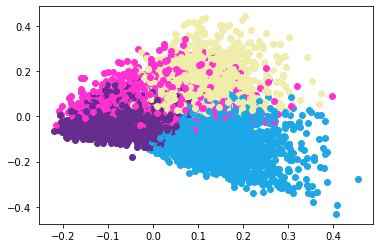

In [14]:
matrix = X.todense()
reduced_data = PCA(n_components=2).fit_transform(matrix)

number_of_colors = clusterNum

colors = ["#"+ "".join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]
print(colors)

fig, ax = plt.subplots()

for i, dot in enumerate(reduced_data):
    x, y = dot[0], dot[1]
    if x > 0.8:
        continue
    color = colors[labels[i]]
    ax.scatter(x, y, c=color)

# for c in colors:
#     ax.legend()

plt.show()

In [15]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn import datasets
metrics.silhouette_score(X, labels, metric='euclidean')

0.005093937021940843

In [19]:
title_to_label = {}
label_to_tokens = defaultdict(list)

for label in labelDict:
    for title in labelDict[label]:
        title_to_label[title] = label

for i in range(startPage, endPage + 1):
    col_name = "purepage" + str(i)
    collection = db[col_name]
    
    for page in collection.find():
        if page["title"] in title_to_label:
            label = title_to_label[page["title"]]
            label_to_tokens[label].append(page["original_post"])

for label in label_to_tokens:
    print(label)
    print(label_to_tokens[label])
    print("===========================================")

0
['Hello I am currently experiencing issues when resolving a domain confluence cornell edu Here are the results when I dig with 1 1 1 1\nDiG 9 10 6\nconfluence cornell edu 1 1 1 1 global options cmd Got answer HEADER\nopcode QUERY status SERVFAIL id 2928 flags qr rd ra QUERY 1 ANSWER 0 AUTHORITY 0 ADDITIONAL 1 OPT PSEUDOSECTION EDNS version 0 flags udp 1232 OPT 15 00 06 OPT 15 00 16 QUESTION SECTION confluence cornell edu IN A Query time 174 msec SERVER 1 1 1 1 53 1 1 1 1 WHEN Thu Dec 02 12 53 47 EST 2021 MSG SIZE rcvd 63 And 1 0 0 1\nDiG 9 10 6\nconfluence cornell edu 1 0 0 1 global options cmd Got answer HEADER\nopcode QUERY status SERVFAIL id 20223 flags qr rd ra QUERY 1 ANSWER 0 AUTHORITY 0 ADDITIONAL 1 OPT PSEUDOSECTION EDNS version 0 flags udp 1232 OPT 15 00 06 OPT 15 00 16 QUESTION SECTION confluence cornell edu IN A Query time 153 msec SERVER 1 0 0 1 53 1 0 0 1 WHEN Thu Dec 02 12 54 04 EST 2021 MSG SIZE rcvd 63 When I use Google DNS it resolves\nDiG 9 10 6\nconfluence cornell 

In [22]:
wordFrequency = defaultdict(lambda : defaultdict(int))

for label in label_to_tokens:
    for post in label_to_tokens[label]:
        unprocessed, processed = post, []
        for word in unprocessed.split(" "):
            lem = lemma(word.strip().lower())

            try:
                _ = int(lem)
                continue
            except:
                pass
            
            if lem not in stopwordDict:
                flag = False
                for char in lem:
                    if char < "a" or char > "z":
                        flag = True
                if not flag:
                    wordFrequency[label][lem] += 1
print(wordFrequency)

defaultdict(<function <lambda> at 0x000001C38AC8A040>, {0: defaultdict(<class 'int'>, {'hello': 1084, 'currently': 290, 'experience': 233, 'issue': 2019, 'resolve': 750, 'domain': 2700, 'confluence': 7, 'cornell': 20, 'edu': 102, 'result': 374, 'dig': 377, 'global': 276, 'option': 512, 'cmd': 187, 'get': 3025, 'answer': 821, 'query': 886, 'status': 564, 'servfail': 140, 'id': 816, 'flag': 406, 'qr': 185, 'rd': 187, 'ra': 181, 'authority': 241, 'additional': 249, 'opt': 212, 'pseudosection': 160, 'edns': 175, 'version': 450, 'udp': 212, 'question': 640, 'section': 385, 'time': 1908, 'msec': 198, 'server': 4092, 'thu': 57, 'dec': 74, 'est': 43, 'msg': 206, 'size': 217, 'rcvd': 216, 'use': 4093, 'google': 602, 'dns': 5842, 'noerror': 101, 'cname': 504, 'contegix': 6, 'com': 2543, 'interest': 56, 'part': 138, 'note': 146, 'response': 587, 'correct': 282, 'record': 1161, 'access': 1316, 'ewr': 5, 'generate': 114, 'link': 426, 'help': 1987, 'information': 301, 'connect': 1193, 'yes': 124, 'h

In [30]:
for label in wordFrequency:
    print(label)
    print("========================================")
    count = 0
    for key in sorted(wordFrequency[label], key = lambda x: wordFrequency[label][x], reverse=True):
        if count >= 50:
            break
        print(key, wordFrequency[label][key])
        count += 1

0
cloudflare 8874
dns 5842
use 4093
server 4092
error 3335
ip 3042
get 3025
work 2901
site 2882
website 2873
domain 2700
com 2543
http 2190
issue 2019
host 2005
help 1987
time 1908
try 1896
one 1809
thank 1740
address 1617
problem 1603
change 1570
wa 1568
set 1428
hi 1339
request 1318
access 1316
warp 1276
ssl 1275
kb 1262
please 1241
page 1199
connect 1193
see 1191
ha 1186
record 1161
need 1107
hello 1084
find 1053
like 1050
know 1033
would 1011
go 1008
check 995
new 990
also 983
show 983
email 966
proxy 966
1
domain 5654
cloudflare 5186
dns 1758
transfer 1256
com 1238
name 1105
change 1096
account 1075
nameservers 1041
registrar 1031
host 1001
add 947
server 943
use 938
try 777
get 742
site 739
thank 690
n 665
point 656
record 643
new 628
wa 625
website 622
help 608
register 602
work 543
need 540
support 504
hi 499
one 499
error 496
still 486
godaddy 484
please 472
want 468
set 453
say 450
show 433
ha 424
email 411
go 406
would 406
issue 402
ip 370
like 362
nameserver 358
update 341
